# Problem statement: 
Underserved people with no/insuffficient credit history have hard time in getting loans. These people become target of untrustworthy lenders.  
    
Home credit is targeting underserved/unbanked population to help get loans. Use of ML to evaluate who among the people can pay loans.
Link to dataset is 
https://www.kaggle.com/c/home-credit-default-risk/data

# Libraries and Utilites

In [257]:
!pip install pandas-profiling 

In [258]:
import pandas as pd
import numpy as np
import seaborn as sns #visualisation
import matplotlib.pyplot as plt #visualisation
%matplotlib inline 
sns.set(color_codes=True)
from sklearn.cluster import KMeans
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import plotly as py
import plotly.graph_objs as go
#from dash import Dash, html, dcc
import plotly.express as px
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [259]:
from pandas_profiling import ProfileReport
import plotly.graph_objects as go
import plotly.offline as po
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import matplotlib.pyplot as plt
import dash
import plotly.express as px
import random
import plotly.figure_factory as ff
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_rows",None)
from sklearn import preprocessing 
%matplotlib inline

# Loading Dataset and checking

Only loading training dataset. Reason,training dataset has "Target" variable where we can figure out the correlation of all variables againts the Target variable.

In [223]:
df_application_train =  pd.read_csv('./application_train.csv')

In [224]:
df_application_train.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
307510,456255,0,Cash loans,F,N,N,0,157500.0,675000.0,49117.5,...,0,0,0,0,0.0,0.0,0.0,2.0,0.0,1.0


# Explore Dataset

In [225]:
df_application_train.shape

(307511, 122)

Dropping duplicates.. :)

In [226]:
df_application=df_application_train.drop_duplicates()
df_application.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [227]:
df_application.shape

(307511, 122)

At this point, we have 307511 records and 122 columns.

Listing and understanding the columns and data types

In [228]:
def check_df(dataframe, head=5):
    
    print(" SHAPE ".center(70,'#'))
    print('Rows: {}'.format(dataframe.shape[0]))
    print('Columns: {}'.format(dataframe.shape[1]))
    print(" TYPES ".center(70,'#'))
    print(dataframe.dtypes)
    print(" HEAD ".center(70,'#'))
    print(dataframe.head(head))
    print(' TAIL '.center(70,'#'))
    print(dataframe.tail(head))
    print(' MISSING VALUES '.center(70,'#'))
    print(dataframe.isnull().sum())
    print(' DUPLICATED VALUES '.center(70,'#'))
    print(dataframe.duplicated().sum())
    print(" QUANTILES ".center(70,'#'))
    print(dataframe.quantile([0, 0.05, 0.50, 0.95, 0.99, 1]).T)

check_df(df_application)

############################### SHAPE ################################
Rows: 307511
Columns: 122
############################### TYPES ################################
SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                 

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

# Data range per column seems to be equal to 307511 

In [229]:
df_application.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)

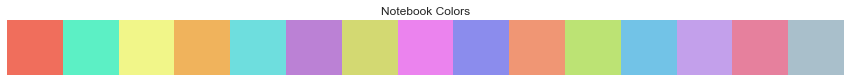

In [230]:
colors = ['#F06E5C','#5CF0C5','#F1F689','#F0B35C','#6EDEDE',
          '#BB81D5','#D3D972','#EB83EE','#8B8CED','#F09674',
          '#BCE374','#72C3E7','#C3A0EB','#E6809D','#A9BFCB']

sns.palplot(sns.color_palette(colors))
plt.title('Notebook Colors', size = 12)
plt.axis('off')
plt.show()

In [231]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    
    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car

cat_cols, num_cols, cat_but_car = grab_col_names(df_application)


Observations: 307511
Variables: 122
cat_cols: 54
num_cols: 67
cat_but_car: 1
num_but_cat: 39


NOTE: We have 54 Categorical data and 67 Numeric data


# Analysis of Categorical data

In [254]:
def cat_summary(dataframe, col_name):
    fig = make_subplots(rows=1,cols=2,
                        subplot_titles=('Countplot','Percentages'),
                        specs=[[{"type": "xy"}, {'type':'domain'}]])

    fig.add_trace(go.Bar( y = dataframe[col_name].value_counts().values.tolist(), 
                          x = dataframe[col_name].value_counts().index, 
                          text=dataframe[col_name].value_counts().values.tolist(),
                          textfont=dict(size=15),
                          name = col_name,
                          textposition = 'auto',
                          showlegend=False,
                          marker=dict(color = colors,
                                      line=dict(color='white',
                                                width=1.5))),
                  row = 1, col = 1)
    fig.add_trace(go.Pie(labels=dataframe[col_name].value_counts().keys(),
                         values=dataframe[col_name].value_counts().values,
                         textfont = dict(size = 20),
                         textposition='auto',
                         showlegend = False,
                         name = col_name,
                         marker=dict(colors=colors)),
                  row = 1, col = 2)
    
    fig.update_layout(title={'text': str(col_name),
                             'y':0.9,
                             'x':0.5,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      template='ggplot2')
    
    iplot(fig)
    
for i in cat_cols:
    cat_summary(df_application,i)

# Dataset - Dimension Reduction

In [232]:
df_application.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

We found missing values  :)

Picking only numerical values as catogrical values will not be helpful to predict

In [233]:
df_application_numerics_only = df_application.select_dtypes(include=np.number)

In [234]:
# Dopping fields that are not required for our analysis

# I will pick top 10 variables - WHY? - Selection is based on dtypes. For prediction we need numerial values. Also, features selection is based on chi-squared (chi²) statistical 
TARGET
AMT_GOODS_PRICE, 
DAYS_BIRTH,
AMT_CREDIT,
AMT_ANNUITY, 
DAYS_EMPLOYED, 
AMT_INCOME_TOTAL, 
OWN_CAR_AGE,
DAYS_REGISTRATION
LIVINGAPARTMENTS_MEDI

In [249]:
column_names = ["TARGET","AMT_GOODS_PRICE","DAYS_BIRTH","AMT_CREDIT","AMT_ANNUITY","DAYS_EMPLOYED","AMT_INCOME_TOTAL","OWN_CAR_AGE","DAYS_REGISTRATION","LIVINGAPARTMENTS_MEDI"]

In [250]:
df_application_numerics_only = df_application_numerics_only.reindex(columns=column_names)

In [237]:
df_application_numerics_only.head()

,TARGET,AMT_GOODS_PRICE,DAYS_BIRTH,AMT_CREDIT,AMT_ANNUITY,DAYS_EMPLOYED,AMT_INCOME_TOTAL,OWN_CAR_AGE,DAYS_REGISTRATION,LIVINGAPARTMENTS_MEDI
0,1,351000.0,-9461,406597.5,24700.5,-637,202500.0,NaN,-3648.0,0.0205
1,0,1129500.0,-16765,1293502.5,35698.5,-1188,270000.0,NaN,-1186.0,0.0787
2,0,135000.0,-19046,135000.0,6750.0,-225,67500.0,26.0,-4260.0,NaN
3,0,297000.0,-19005,312682.5,29686.5,-3039,135000.0,NaN,-9833.0,NaN
4,0,513000.0,-19932,513000.0,21865.5,-3038,121500.0,NaN,-4311.0,NaN


Dropping NaN values

In [238]:
df_application_numerics_only = df_application_numerics_only.dropna()

#I see some -ve values. We can drop that. 

In [239]:
df_application_numerics_only.head()

,TARGET,AMT_GOODS_PRICE,DAYS_BIRTH,AMT_CREDIT,AMT_ANNUITY,DAYS_EMPLOYED,AMT_INCOME_TOTAL,OWN_CAR_AGE,DAYS_REGISTRATION,LIVINGAPARTMENTS_MEDI
13,0,697500.0,-14086,918468.0,28966.5,-3028,225000.0,23.0,-643.0,0.1223
20,0,427500.0,-18252,427500.0,21375.0,-4286,135000.0,7.0,-298.0,0.0599
24,0,247500.0,-11286,247500.0,12703.5,-746,135000.0,7.0,-108.0,0.1189
39,0,540000.0,-16126,540000.0,27000.0,-1761,180000.0,3.0,-8236.0,0.0667
59,0,1129500.0,-20544,1227901.5,46899.0,-2091,540000.0,2.0,-6846.0,0.0086


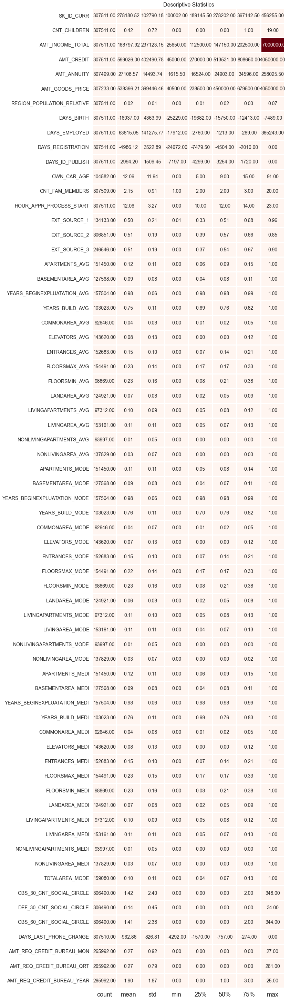

In [240]:
def desc_stats(dataframe):
    desc = dataframe.describe().T
    desc_df = pd.DataFrame(index= [col for col in dataframe.columns], 
                           columns= desc.columns,
                           data= desc)
    
    f,ax = plt.subplots(figsize=(10,
                                 desc_df.shape[0]*0.78))
    sns.heatmap(desc_df,
                annot=True,
                cmap = "Reds",
                fmt= '.2f',
                ax=ax,
                linewidths = 2.6,
                cbar = False,
                annot_kws={"size": 14})
    plt.xticks(size = 18)
    plt.yticks(size = 14,
               rotation = 0)
    plt.title("Descriptive Statistics", size = 16)
    plt.show()
    
desc_stats(df_application[num_cols])

# Exploratory Data Analysis

Checking Correlation for top 10 variable

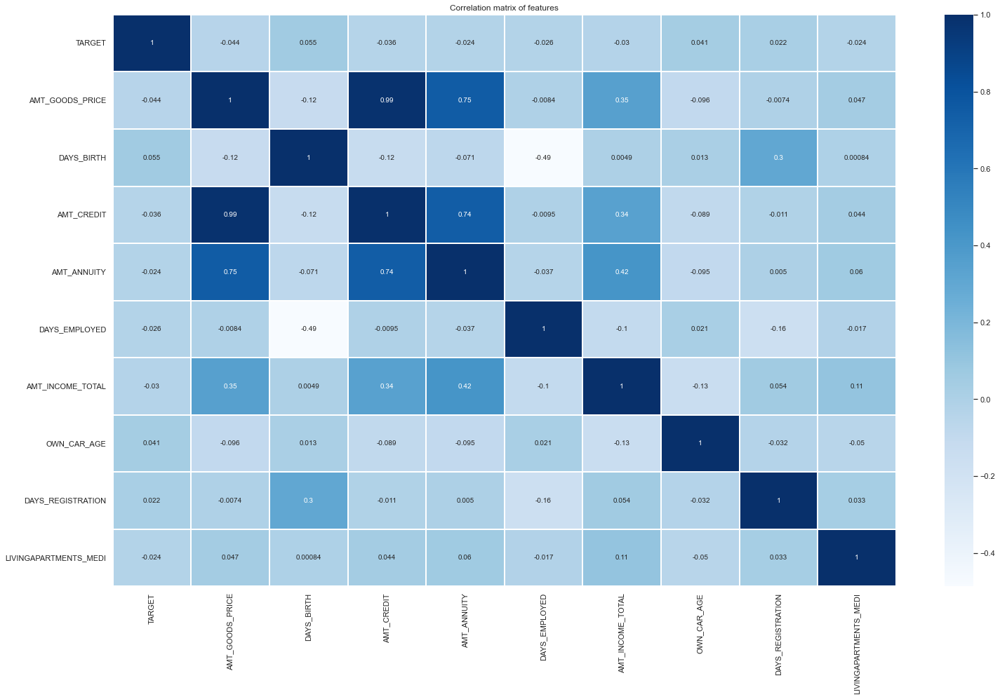

In [242]:
corr = df_application_numerics_only.corr()
fig, ax = plt.subplots(figsize=(25,15)) 
sns.heatmap(corr,annot=True, cmap = "Blues", linewidth = 0.30)
plt.title("Correlation matrix of features")
plt.show()

In [243]:
df_application_numerics_only.corr()["TARGET"]

TARGET                   1.000000
AMT_GOODS_PRICE         -0.044430
DAYS_BIRTH               0.054889
AMT_CREDIT              -0.035853
AMT_ANNUITY             -0.024086
DAYS_EMPLOYED           -0.025836
AMT_INCOME_TOTAL        -0.030080
OWN_CAR_AGE              0.041403
DAYS_REGISTRATION        0.022371
LIVINGAPARTMENTS_MEDI   -0.024086
Name: TARGET, dtype: float64

# Shows -ve values for AMT_GOODS_PRICE, AMT_CREDIT, AMT_ANNUITY, DAY EMPLOYED, AMT_INCOME_TOTAL and LIVINGAPARTMENTS_MEDI. +ve for DAYS_BIRTH,OWN_CAR_AGE,DAYS_REGISTRATION

In [244]:
th = 0.02
app_corr = df_application_numerics_only.corr()['TARGET']
high_corr = app_corr[app_corr > th].keys()

print("High correlation columns:", high_corr)

High correlation columns: Index(['TARGET', 'DAYS_BIRTH', 'OWN_CAR_AGE', 'DAYS_REGISTRATION'], dtype='object')


In [245]:
# drop features under the threshold

In [246]:
app_high_corr = df_application_numerics_only.drop(corr["TARGET"][corr["TARGET"]<= th].keys(), axis=1)
app_high_corr.head()

,TARGET,DAYS_BIRTH,OWN_CAR_AGE,DAYS_REGISTRATION
13,0,-14086,23.0,-643.0
20,0,-18252,7.0,-298.0
24,0,-11286,7.0,-108.0
39,0,-16126,3.0,-8236.0
59,0,-20544,2.0,-6846.0


In [247]:
profile = ProfileReport(df_application_numerics_only,title='Home Credit Indicator')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Analysis of Numerical Data¶

In [253]:
def cat_summary(dataframe, col_name):
    fig = make_subplots(rows=1,cols=2,
                        subplot_titles=('Countplot','Percentages'),
                        specs=[[{"type": "xy"}, {'type':'domain'}]])

    fig.add_trace(go.Bar( y = dataframe[col_name].value_counts().values.tolist(), 
                          x = dataframe[col_name].value_counts().index, 
                          text=dataframe[col_name].value_counts().values.tolist(),
                          textfont=dict(size=15),
                          name = col_name,
                          textposition = 'auto',
                          showlegend=False,
                          marker=dict(color = colors,
                                      line=dict(color='white',
                                                width=1.5))),
                  row = 1, col = 1)
    fig.add_trace(go.Pie(labels=dataframe[col_name].value_counts().keys(),
                         values=dataframe[col_name].value_counts().values,
                         textfont = dict(size = 20),
                         textposition='auto',
                         showlegend = False,
                         name = col_name,
                         marker=dict(colors=colors)),
                  row = 1, col = 2)
    
    fig.update_layout(title={'text': str(col_name),
                             'y':0.9,
                             'x':0.5,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      template='ggplot2')
    
    iplot(fig)
    
for i in cat_cols:
    cat_summary(df_application,i)

# CONCLUSION: We had 122 columns, some variables were numerical and some variables were categorical.
    For prediction, we prefer numerical. 
    For categorial, we have to convert to some form of numerical in order to use variables in prediction.
    Also, we use heatmap to understand the correlation of all variables against TARGET variable. Other methods
    are to use Chi square score. Higher the score means highly correlated and will be worth selecting that 
    variable to use it for prediction.
    